Sensor readings from a wall-following robot

dataset:https://www.kaggle.com/uciml/wall-following-robot
https://archive.ics.uci.edu/ml/machine-learning-databases/00194/


In [73]:
import numpy as np
import pandas as pd
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline

adding headers to all the 24 sensors and the class variable


In [99]:
df=pd.read_csv('sensor_readings_24.csv', header=None)
headerList = ['S1','S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10', 'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20', 'S21' ,'S22', 'S23', 'S24','class'  ]
df.to_csv("newsensor_readings_24.csv", header=headerList, index=False)
df2 = pd.read_csv("newsensor_readings_24.csv")

In [100]:
df2

,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,S11,S12,S13,S14,S15,S16,S17,S18,S19,S20,S21,S22,S23,S24,class
0,0.438,0.498,3.625,3.645,5.000,2.918,5.000,2.351,2.332,2.643,1.698,1.687,1.698,1.717,1.744,0.593,0.502,0.493,0.504,0.445,0.431,0.444,0.440,0.429,Slight-Right-Turn
1,0.438,0.498,3.625,3.648,5.000,2.918,5.000,2.637,2.332,2.649,1.695,1.687,1.695,1.720,1.744,0.592,0.502,0.493,0.504,0.449,0.431,0.444,0.443,0.429,Slight-Right-Turn
2,0.438,0.498,3.625,3.629,5.000,2.918,5.000,2.637,2.334,2.643,1.696,1.687,1.695,1.717,1.744,0.593,0.502,0.493,0.504,0.449,0.431,0.444,0.446,0.429,Slight-Right-Turn
3,0.437,0.501,3.625,3.626,5.000,2.918,5.000,2.353,2.334,2.642,1.730,1.687,1.695,1.717,1.744,0.593,0.502,0.493,0.504,0.449,0.431,0.444,0.444,0.429,Slight-Right-Turn
4,0.438,0.498,3.626,3.629,5.000,2.918,5.000,2.640,2.334,2.639,1.696,1.687,1.695,1.717,1.744,0.592,0.502,0.493,0.504,0.449,0.431,0.444,0.441,0.429,Slight-Right-Turn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,0.910,5.000,3.997,2.785,2.770,2.572,2.433,1.087,1.772,1.040,1.024,1.057,1.285,1.285,5.000,0.660,0.648,0.657,0.686,5.000,1.045,5.000,5.000,1.562,Move-Forward
5452,0.926,5.000,4.015,2.792,2.777,2.571,1.768,1.071,1.762,1.021,1.005,1.044,1.269,1.266,0.894,0.652,0.640,0.649,1.593,1.616,1.058,5.000,5.000,1.085,Sharp-Right-Turn
5453,0.937,5.000,4.034,2.799,2.784,2.571,1.754,1.053,1.752,1.002,0.987,1.001,1.078,1.246,0.873,0.648,0.633,0.642,0.741,5.000,1.065,5.000,5.000,1.105,Sharp-Right-Turn
5454,0.945,4.052,4.052,2.809,2.791,2.441,1.757,1.034,1.743,0.983,0.967,0.979,1.055,1.227,5.000,0.641,0.626,0.635,0.754,5.000,1.076,5.000,5.000,1.118,Move-Forward


In [101]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   S1      5456 non-null   float64
 1   S2      5456 non-null   float64
 2   S3      5456 non-null   float64
 3   S4      5456 non-null   float64
 4   S5      5456 non-null   float64
 5   S6      5456 non-null   float64
 6   S7      5456 non-null   float64
 7   S8      5456 non-null   float64
 8   S9      5456 non-null   float64
 9   S10     5456 non-null   float64
 10  S11     5456 non-null   float64
 11  S12     5456 non-null   float64
 12  S13     5456 non-null   float64
 13  S14     5456 non-null   float64
 14  S15     5456 non-null   float64
 15  S16     5456 non-null   float64
 16  S17     5456 non-null   float64
 17  S18     5456 non-null   float64
 18  S19     5456 non-null   float64
 19  S20     5456 non-null   float64
 20  S21     5456 non-null   float64
 21  S22     5456 non-null   float64
 22  

In [94]:
df2.describe()

,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,S11,S12,S13,S14,S15,S16,S17,S18,S19,S20,S21,S22,S23,S24
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000
mean,1.471617,2.327043,2.489347,2.796501,2.958552,2.893073,3.351113,2.540397,3.125621,2.832386,2.549398,2.077776,2.125777,2.190486,2.205772,1.202111,0.989831,0.910273,1.05811,1.076320,1.015923,1.778034,1.555045,1.578508
std,0.802801,1.410146,1.247435,1.309368,1.339225,1.282575,1.413692,1.111554,1.356965,1.307843,1.382029,1.249301,1.407168,1.576873,1.715435,1.098568,0.942075,0.889527,1.14463,1.141498,0.887439,1.571686,1.291447,1.150480
min,0.400000,0.437000,0.470000,0.833000,1.120000,1.114000,1.122000,0.859000,0.836000,0.810000,0.783000,0.778000,0.770000,0.756000,0.495000,0.424000,0.373000,0.354000,0.34000,0.355000,0.380000,0.370000,0.367000,0.377000
25%,0.921000,1.362000,1.538750,1.731000,1.774000,1.785750,1.930750,1.618000,1.799750,1.636000,1.579000,1.293000,1.190750,1.031000,0.860000,0.690000,0.581000,0.529750,0.52300,0.541750,0.567000,0.743000,0.792000,0.884000
50%,1.335000,1.904500,2.064000,2.458000,2.667000,2.682500,3.225500,2.172000,2.802000,2.679000,1.999500,1.689000,1.609000,1.493000,1.328500,0.803000,0.738000,0.685000,0.69100,0.693000,0.764000,1.030500,1.071000,1.289000
75%,1.814000,2.681500,2.739250,4.093500,4.314500,3.835250,5.000000,3.193000,5.000000,3.526250,3.216250,2.281500,2.357750,2.739250,4.436250,1.159000,0.913000,0.837000,0.85700,0.863000,1.002250,2.068250,1.559500,1.657250
max,5.000000,5.025000,5.029000,5.017000,5.000000,5.005000,5.008000,5.087000,5.000000,5.022000,5.019000,5.000000,5.003000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000


In [95]:
df2.shape

(5456, 25)

In [96]:
df2.isnull().sum()

S1       0
S2       0
S3       0
S4       0
S5       0
S6       0
S7       0
S8       0
S9       0
S10      0
S11      0
S12      0
S13      0
S14      0
S15      0
S16      0
S17      0
S18      0
S19      0
S20      0
S21      0
S22      0
S23      0
S24      0
Class    0
dtype: int64

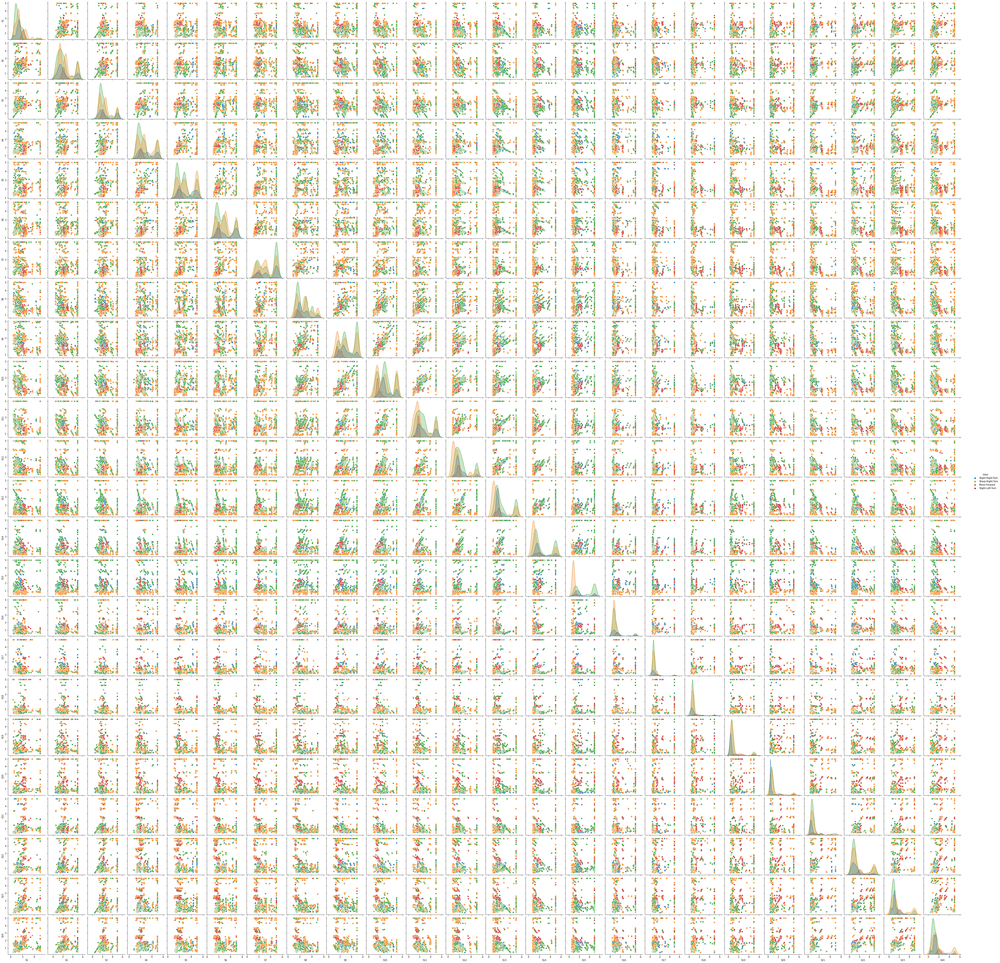

In [21]:
sb.pairplot(df2,hue='class')

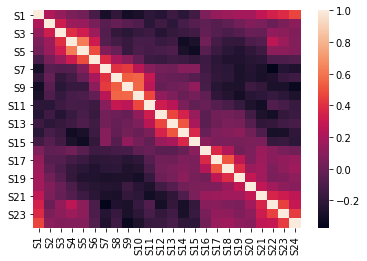

In [22]:
sb.heatmap(df2.corr()) 
plt.show()

assigning input attributes and output attributes separately

In [23]:
X=df2.drop(['class'],axis=1)
y=df2['class']

Now logistic regression

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.5)##50:50 train:test ratio
logistic = LogisticRegression()
logistic.fit(X_train,y_train)
y_predict = logistic.predict(X_test)
y_predict = logistic.predict(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [25]:
print('Accuracy:',accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy: 0.6847507331378299
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.74      0.70      0.72      1112
 Sharp-Right-Turn       0.65      0.77      0.71      1022
 Slight-Left-Turn       0.60      0.54      0.57       168
Slight-Right-Turn       0.66      0.50      0.57       426

         accuracy                           0.68      2728
        macro avg       0.66      0.63      0.64      2728
     weighted avg       0.69      0.68      0.68      2728



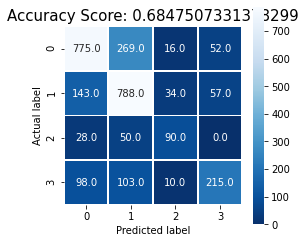

In [26]:
plt.figure(figsize=(4,4))
sb.heatmap(confusion_matrix(y_test,y_predict), annot=True, fmt=".1f", linewidths=.90, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test, y_predict))
plt.title(all_sample_title, size = 15);

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)##80:20 train:test ratio
logistic = LogisticRegression()
logistic.fit(X_train,y_train)
y_predict = logistic.predict(X_test)
y_predict = logistic.predict(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [28]:
print('Accuracy:',accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy: 0.6831501831501832
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.73      0.69      0.71       430
 Sharp-Right-Turn       0.67      0.76      0.71       424
 Slight-Left-Turn       0.64      0.55      0.59        74
Slight-Right-Turn       0.61      0.51      0.56       164

         accuracy                           0.68      1092
        macro avg       0.66      0.63      0.64      1092
     weighted avg       0.68      0.68      0.68      1092



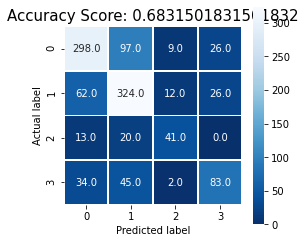

In [29]:
plt.figure(figsize=(4,4))
sb.heatmap(confusion_matrix(y_test,y_predict), annot=True, fmt=".1f", linewidths=.90, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test, y_predict))
plt.title(all_sample_title, size = 15);

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25)##75:25 train:test ratio
logistic = LogisticRegression()
logistic.fit(X_train,y_train)
y_predict = logistic.predict(X_test)
y_predict = logistic.predict(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [31]:
print('Accuracy:',accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy: 0.7023460410557185
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.75      0.70      0.72       542
 Sharp-Right-Turn       0.68      0.81      0.74       533
 Slight-Left-Turn       0.63      0.53      0.58        77
Slight-Right-Turn       0.69      0.49      0.57       212

         accuracy                           0.70      1364
        macro avg       0.69      0.63      0.65      1364
     weighted avg       0.70      0.70      0.70      1364



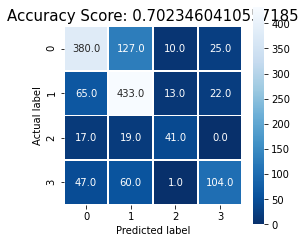

In [32]:
plt.figure(figsize=(4,4))
sb.heatmap(confusion_matrix(y_test,y_predict), annot=True, fmt=".1f", linewidths=.90, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test, y_predict))
plt.title(all_sample_title, size = 15);

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3)##70:30 train:test ratio
logistic = LogisticRegression()
logistic.fit(X_train,y_train)
y_predict = logistic.predict(X_test)
y_predict = logistic.predict(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [34]:
print('Accuracy:',accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy: 0.6860109957238851
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.75      0.68      0.71       672
 Sharp-Right-Turn       0.67      0.78      0.72       633
 Slight-Left-Turn       0.51      0.54      0.52        85
Slight-Right-Turn       0.63      0.52      0.57       247

         accuracy                           0.69      1637
        macro avg       0.64      0.63      0.63      1637
     weighted avg       0.69      0.69      0.68      1637



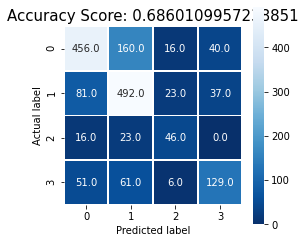

In [35]:
plt.figure(figsize=(4,4))
sb.heatmap(confusion_matrix(y_test,y_predict), annot=True, fmt=".1f", linewidths=.90, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test, y_predict))
plt.title(all_sample_title, size = 15);

now decision tree

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5)##50:50 train:test ratio
tree=DecisionTreeClassifier(criterion="entropy")
tree.fit(X_train,y_train)
treeprediction=tree.predict(X_test)

In [42]:
print('Accuracy:',accuracy_score(y_test,treeprediction))
print('Classification Report',classification_report(y_test,treeprediction))

Accuracy: 0.9904692082111437
Classification Report                    precision    recall  f1-score   support

     Move-Forward       1.00      0.99      0.99      1137
 Sharp-Right-Turn       0.99      0.99      0.99      1020
 Slight-Left-Turn       0.97      1.00      0.98       158
Slight-Right-Turn       0.97      1.00      0.98       413

         accuracy                           0.99      2728
        macro avg       0.98      0.99      0.99      2728
     weighted avg       0.99      0.99      0.99      2728



In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)##80:20 train:test ratio
tree=DecisionTreeClassifier(criterion="entropy")
tree.fit(X_train,y_train)
treeprediction=tree.predict(X_test)

In [45]:
print('Accuracy:',accuracy_score(y_test,treeprediction))
print('Classification Report',classification_report(y_test,treeprediction))

Accuracy: 0.9954212454212454
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.99      1.00      1.00       418
 Sharp-Right-Turn       1.00      1.00      1.00       418
 Slight-Left-Turn       0.99      0.99      0.99        69
Slight-Right-Turn       0.99      0.99      0.99       187

         accuracy                           1.00      1092
        macro avg       0.99      0.99      0.99      1092
     weighted avg       1.00      1.00      1.00      1092



In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)##75:25 train:test ratio
tree=DecisionTreeClassifier(criterion="entropy")
tree.fit(X_train,y_train)
treeprediction=tree.predict(X_test)

In [48]:
print('Accuracy:',accuracy_score(y_test,treeprediction))
print('Classification Report',classification_report(y_test,treeprediction))

Accuracy: 0.9919354838709677
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.99      0.99      0.99       552
 Sharp-Right-Turn       1.00      1.00      1.00       535
 Slight-Left-Turn       0.99      0.96      0.97        79
Slight-Right-Turn       0.98      0.99      0.98       198

         accuracy                           0.99      1364
        macro avg       0.99      0.99      0.99      1364
     weighted avg       0.99      0.99      0.99      1364



In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)##70:30 train:test ratio
tree=DecisionTreeClassifier(criterion="entropy")
tree.fit(X_train,y_train)
treeprediction=tree.predict(X_test)

In [50]:
print('Accuracy:',accuracy_score(y_test,treeprediction))
print('Classification Report',classification_report(y_test,treeprediction))

Accuracy: 0.9957238851557727
Classification Report                    precision    recall  f1-score   support

     Move-Forward       1.00      1.00      1.00       706
 Sharp-Right-Turn       0.99      0.99      0.99       594
 Slight-Left-Turn       0.99      1.00      0.99        93
Slight-Right-Turn       1.00      1.00      1.00       244

         accuracy                           1.00      1637
        macro avg       0.99      1.00      1.00      1637
     weighted avg       1.00      1.00      1.00      1637



now naive bayes

In [53]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.5)##50:50 train:test ratio
gnb = GaussianNB()
gnb.fit(X_train,y_train)
y_pred=gnb.predict(X_test)

In [55]:
print("Accuracy is :",accuracy_score(y_test,y_pred))
print('Classification Report',classification_report(y_test,y_pred))

Accuracy is : 0.5362903225806451
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.68      0.43      0.53      1088
 Sharp-Right-Turn       0.71      0.45      0.55      1064
 Slight-Left-Turn       0.51      0.94      0.66       172
Slight-Right-Turn       0.34      0.87      0.48       404

         accuracy                           0.54      2728
        macro avg       0.56      0.67      0.56      2728
     weighted avg       0.63      0.54      0.54      2728



In [57]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)##80:20 train:test ratio
gnb = GaussianNB()
gnb.fit(X_train,y_train)
y_pred=gnb.predict(X_test)

In [58]:
print("Accuracy is :",accuracy_score(y_test,y_pred))
print('Classification Report',classification_report(y_test,y_pred))

Accuracy is : 0.5558608058608059
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.71      0.43      0.53       438
 Sharp-Right-Turn       0.69      0.49      0.58       407
 Slight-Left-Turn       0.50      0.93      0.65        68
Slight-Right-Turn       0.38      0.87      0.53       179

         accuracy                           0.56      1092
        macro avg       0.57      0.68      0.57      1092
     weighted avg       0.63      0.56      0.56      1092



In [59]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)##75:25 train:test ratio
gnb = GaussianNB()
gnb.fit(X_train,y_train)
y_pred=gnb.predict(X_test)

In [60]:
print("Accuracy is :",accuracy_score(y_test,y_pred))
print('Classification Report',classification_report(y_test,y_pred))

Accuracy is : 0.5117302052785924
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.69      0.41      0.51       538
 Sharp-Right-Turn       0.67      0.40      0.51       526
 Slight-Left-Turn       0.46      0.94      0.62        82
Slight-Right-Turn       0.33      0.86      0.48       218

         accuracy                           0.51      1364
        macro avg       0.54      0.65      0.53      1364
     weighted avg       0.61      0.51      0.51      1364



In [61]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)##70:30 train:test ratio
gnb = GaussianNB()
gnb.fit(X_train,y_train)
y_pred=gnb.predict(X_test)

In [62]:
print("Accuracy is :",accuracy_score(y_test,y_pred))
print('Classification Report',classification_report(y_test,y_pred))

Accuracy is : 0.5222968845448992
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.68      0.40      0.51       656
 Sharp-Right-Turn       0.67      0.44      0.53       619
 Slight-Left-Turn       0.43      0.95      0.59        93
Slight-Right-Turn       0.36      0.86      0.51       269

         accuracy                           0.52      1637
        macro avg       0.54      0.66      0.53      1637
     weighted avg       0.61      0.52      0.52      1637



now mlp

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.5)##50:50 train:test ratio
MLP = MLPClassifier(max_iter=500, activation='relu')
MLP.fit(X_train,y_train)
prediction = MLP.predict(X_test)

In [66]:
print("Accuracy is :",accuracy_score(y_test,prediction))
print('Classification Report',classification_report(y_test,prediction))

Accuracy is : 0.9219208211143695
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.92      0.90      0.91      1091
 Sharp-Right-Turn       0.94      0.95      0.94      1060
 Slight-Left-Turn       0.91      0.93      0.92       167
Slight-Right-Turn       0.89      0.91      0.90       410

         accuracy                           0.92      2728
        macro avg       0.91      0.92      0.92      2728
     weighted avg       0.92      0.92      0.92      2728



In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2)##80:20 train:test ratio
MLP = MLPClassifier(max_iter=500, activation='relu')
MLP.fit(X_train,y_train)
prediction = MLP.predict(X_test)

In [68]:
print("Accuracy is :",accuracy_score(y_test,prediction))
print('Classification Report',classification_report(y_test,prediction))

Accuracy is : 0.9441391941391941
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.96      0.93      0.94       449
 Sharp-Right-Turn       0.94      0.97      0.95       386
 Slight-Left-Turn       0.92      0.90      0.91        78
Slight-Right-Turn       0.94      0.94      0.94       179

         accuracy                           0.94      1092
        macro avg       0.94      0.94      0.94      1092
     weighted avg       0.94      0.94      0.94      1092



In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.25)##75:25 train:test ratio
MLP = MLPClassifier(max_iter=500, activation='relu')
MLP.fit(X_train,y_train)
prediction = MLP.predict(X_test)

In [70]:
print("Accuracy is :",accuracy_score(y_test,prediction))
print('Classification Report',classification_report(y_test,prediction))

Accuracy is : 0.9354838709677419
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.94      0.92      0.93       560
 Sharp-Right-Turn       0.94      0.96      0.95       532
 Slight-Left-Turn       0.91      0.86      0.89        74
Slight-Right-Turn       0.92      0.92      0.92       198

         accuracy                           0.94      1364
        macro avg       0.93      0.92      0.92      1364
     weighted avg       0.94      0.94      0.94      1364



In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3)##70:30 train:test ratio
MLP = MLPClassifier(max_iter=500, activation='relu')
MLP.fit(X_train,y_train)
prediction = MLP.predict(X_test)

In [72]:
print("Accuracy is :",accuracy_score(y_test,prediction))
print('Classification Report',classification_report(y_test,prediction))

Accuracy is : 0.9309712889431888
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.95      0.89      0.92       665
 Sharp-Right-Turn       0.94      0.97      0.95       608
 Slight-Left-Turn       0.92      0.93      0.92        95
Slight-Right-Turn       0.88      0.94      0.91       269

         accuracy                           0.93      1637
        macro avg       0.92      0.93      0.93      1637
     weighted avg       0.93      0.93      0.93      1637



now KNN classification

In [74]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.5)##50:50 train:test ratio
neighbors = np.arange(1,25)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
for i,k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)

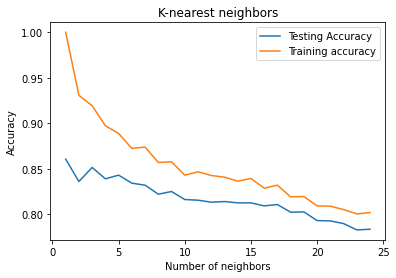

In [75]:
plt.title('K-nearest neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [76]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.8515395894428153

In [77]:
y_predict = knn.predict(X_test)
print("Accuracy is :",accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy is : 0.8515395894428153
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.83      0.85      0.84      1083
 Sharp-Right-Turn       0.88      0.86      0.87      1075
 Slight-Left-Turn       0.90      0.88      0.89       147
Slight-Right-Turn       0.81      0.83      0.82       423

         accuracy                           0.85      2728
        macro avg       0.86      0.85      0.85      2728
     weighted avg       0.85      0.85      0.85      2728



In [78]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)##80:20 train:test ratio
neighbors = np.arange(1,25)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
for i,k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)

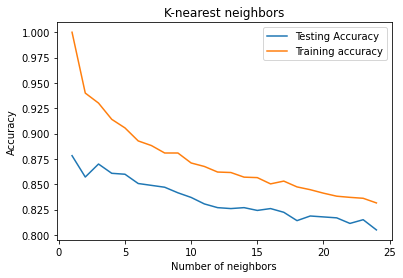

In [79]:
plt.title('K-nearest neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [80]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.86996336996337

In [81]:
y_predict = knn.predict(X_test)
print("Accuracy is :",accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy is : 0.86996336996337
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.85      0.87      0.86       448
 Sharp-Right-Turn       0.88      0.88      0.88       408
 Slight-Left-Turn       0.93      0.82      0.87        62
Slight-Right-Turn       0.88      0.86      0.87       174

         accuracy                           0.87      1092
        macro avg       0.88      0.86      0.87      1092
     weighted avg       0.87      0.87      0.87      1092



In [82]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)##75:25 train:test ratio
neighbors = np.arange(1,25)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
for i,k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)

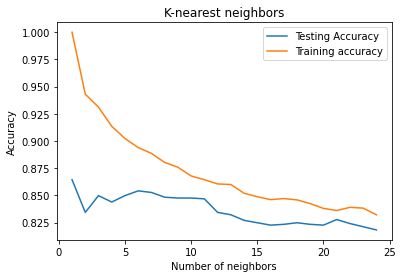

In [83]:
plt.title('K-nearest neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [84]:
knn = KNeighborsClassifier(n_neighbors=6)
knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.8541055718475073

In [85]:
y_predict = knn.predict(X_test)
print("Accuracy is :",accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy is : 0.8541055718475073
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.83      0.89      0.86       571
 Sharp-Right-Turn       0.88      0.86      0.87       491
 Slight-Left-Turn       0.92      0.79      0.85        75
Slight-Right-Turn       0.86      0.78      0.82       227

         accuracy                           0.85      1364
        macro avg       0.87      0.83      0.85      1364
     weighted avg       0.86      0.85      0.85      1364



In [86]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)##50:50 train:test ratio
neighbors = np.arange(1,25)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
for i,k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)

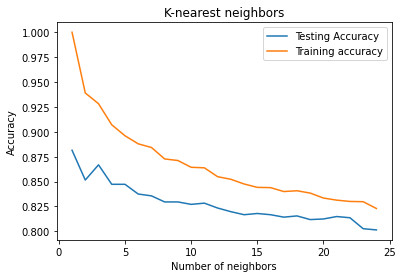

In [87]:
plt.title('K-nearest neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [88]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.8668295662797801

In [89]:
y_predict = knn.predict(X_test)
print("Accuracy is :",accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))

Accuracy is : 0.8668295662797801
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.85      0.86      0.86       658
 Sharp-Right-Turn       0.90      0.90      0.90       630
 Slight-Left-Turn       0.89      0.89      0.89        95
Slight-Right-Turn       0.82      0.79      0.80       254

         accuracy                           0.87      1637
        macro avg       0.87      0.86      0.86      1637
     weighted avg       0.87      0.87      0.87      1637



among all the machine learning algorithms used decision tree gives with the high accuracy of 0.9957 in train:test ratio 70:30 ratio and naive bayes gives the least accuracy of 0.511 in train:test ratio 75:25 ratio